<a href="https://colab.research.google.com/github/biglool/Hologram_Cell_detection/blob/main/notebooks/quantization/quantization_Test.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Quantization aware training in Keras example

## Setup

In [1]:
! pip install -q tensorflow
! pip install -q tensorflow-model-optimization


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 242.5/242.5 kB 5.7 MB/s eta 0:00:00


In [2]:
!python -c 'import keras; print(keras.__version__)'

2024-08-29 10:57:33.665024: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-08-29 10:57:33.685893: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-08-29 10:57:33.708724: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-08-29 10:57:33.715304: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-08-29 10:57:33.731072: I tensorflow/core/platform/cpu_feature_guar

In [3]:
import tempfile
import os

import tensorflow as tf

from tensorflow_model_optimization.python.core.keras.compat import keras

In [4]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)


Mounted at /content/gdrive


In [5]:
ruta_save_models= '/content/gdrive/MyDrive/Curro/Hologrames/models/'

# Carga de dades

In [6]:

import zipfile

holo_zip = '/content/gdrive/MyDrive/Curro/Hologrames/Datos_sinteticos/Holo_subdiv/Net_325_256_prof_950_830_siz_8_18.zip'
holo_zip = '/content/gdrive/MyDrive/Curro/Hologrames/Datos_sinteticos/Holo_subdiv/Net_325_256_prof_950_800_siz_11_14.zip'

destino= "Datos_sinteticos/"

def unzip(origin,destino):
  with zipfile.ZipFile(origin, 'r') as zip_ref:
      zip_ref.extractall(destino)
unzip(holo_zip,destino)

In [7]:
%cd 'Datos_sinteticos/'

/content/Datos_sinteticos


In [8]:


from tensorflow.keras.utils import Sequence

import os

#import keras
import numpy as np
import matplotlib.pyplot as plt


from tensorflow import data as tf_data
from tensorflow import image as tf_image
from tensorflow import io as tf_io


class DataGenerator(Sequence):
    def __init__(self, data_folder, ground_truth_folder, batch_size, img_shape, shuffle=True, data_augmentation=False,max_examples=0):
        self.data_folder = data_folder
        self.ground_truth_folder = ground_truth_folder
        self.batch_size = batch_size
        self.img_shape = img_shape
        self.shuffle = shuffle
        self.data_files = sorted([f for f in os.listdir(data_folder) ])
        self.ground_truth_files = sorted([f for f in os.listdir(ground_truth_folder) ])
        self.indexes = np.arange(len(self.data_files))
        self.max_examples=max_examples
        self.on_epoch_end()
        self.rng =  tf.random.Generator.from_seed(123, alg='philox')
        self.data_augmentation = data_augmentation

    def __len__(self):
        # Number of batches per epoch
        if  self.max_examples ==0:
          num_exemp=len(self.data_files)
        else:
          num_exemp=self.max_examples
        return int(np.floor(num_exemp / self.batch_size))

    def __getitem__(self, index):
        # Generate indexes of the batch
        batch_indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]

        # Find list of IDs
        batch_data_files = [self.data_files[k] for k in batch_indexes]
        batch_ground_truth_files = [self.ground_truth_files[k] for k in batch_indexes]

        # Generate data
        X, y = self.__data_generation(batch_data_files, batch_ground_truth_files)

        return X, y

    def on_epoch_end(self):
        # Updates indexes after each epoch
        if self.shuffle:
            np.random.shuffle(self.indexes)

    def scale_array(self, array):
        min_val = np.min(array)
        max_val = np.max(array)
        scaled_array = 2 * (array - min_val) / (max_val - min_val) - 1
        return scaled_array

    def convert_to_int(self, array):
        min_val = np.min(array)
        max_val = np.max(array)
        scaled_array = 255 * (array - min_val) / (max_val - min_val)
        return np.array(scaled_array).astype(np.uint8)



    def augment_data(self, data_array, mascara_array):

        #left right
        lr_coin = tf.less(tf.random.uniform((), 0., 1.), 0.5)
        data_array = tf.cond(lr_coin, lambda: tf_image.flip_left_right(data_array), lambda: data_array)
        mascara_array = tf.cond(lr_coin, lambda: tf_image.flip_left_right(mascara_array), lambda: mascara_array)

        # updown flip
        ud_coin = tf.less(tf.random.uniform((), 0., 1.), 0.5)
        data_array = tf.cond(ud_coin, lambda: tf_image.flip_up_down(data_array), lambda: data_array)
        mascara_array = tf.cond(ud_coin, lambda: tf_image.flip_up_down(mascara_array), lambda: mascara_array)

        # brightness
        bright_coin = tf.less(tf.random.uniform((), 0., 1.), 0.2)
        seed = self.rng.make_seeds(2)[0]
        data_array=tf.cond(bright_coin, lambda: np.array(tf_image.stateless_random_brightness(np.array(data_array).T, max_delta=0.95, seed=seed)).T, lambda: data_array)


        #contrast
        contrastt_coin = tf.less(tf.random.uniform((), 0., 1.), 0.2)
        seed = self.rng.make_seeds(2)[0]
        data_array=tf.cond(contrastt_coin, lambda: np.array(tf_image.stateless_random_contrast(np.array(data_array).T, lower=0.1, upper=0.9, seed=seed)).T, lambda: data_array)

        data_array = self.scale_array(data_array)

        return data_array, mascara_array



    def __data_generation(self, batch_data_files, batch_ground_truth_files):
        # Initialization
        X = np.empty((self.batch_size, *self.img_shape), dtype='uint8')#'float32')
        y = np.empty((self.batch_size, *self.img_shape), dtype='uint8')#'float32')

        # Generate data
        for i, (data_file, gt_file) in enumerate(zip(batch_data_files, batch_ground_truth_files)):
            # Load data and ground truth
            data_array = np.loadtxt(os.path.join(self.data_folder, data_file))
            data_array = self.scale_array(data_array)
            data_array =data_array.reshape(self.img_shape)

            ground_truth_array= np.loadtxt(os.path.join(self.ground_truth_folder, gt_file))
            ground_truth_array=ground_truth_array.reshape(self.img_shape)#np.expand_dims(ground_truth_array,axis=2)

            # data augmentation

            if self.data_augmentation:
               data_array, ground_truth_array =   self.augment_data(data_array,ground_truth_array)



            X[i,] = self.convert_to_int(data_array)#.reshape(self.img_shape)
            y[i,] = np.array(ground_truth_array).astype(np.uint8) #.reshape(self.img_shape)

        return X, y


# fer unzip aki per treballar en local
#zip_file="/content/gdrive/MyDrive/Curro/Hologrames/
#destino = "/content/"
#unzip(holo_zip,destino_holo)

data_folder = 'hologramas' #afegir  destino
ground_truth_folder = 'mascaras' #afegir  destino
img_shape = (256,384,1)
batch_size=16
#(2662,2128,1)


# Create data generators for training, validation, and test sets
train_gen = DataGenerator(data_folder+"/train/", ground_truth_folder+"/train/", batch_size,img_shape,data_augmentation=True, shuffle=True)
val_gen = DataGenerator(data_folder+"/val/", ground_truth_folder+"/val/", batch_size, img_shape, shuffle=False)
test_gen = DataGenerator(data_folder+"/test/", ground_truth_folder+"/test/", batch_size, img_shape, shuffle=False)

437
<class 'tuple'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
imagen


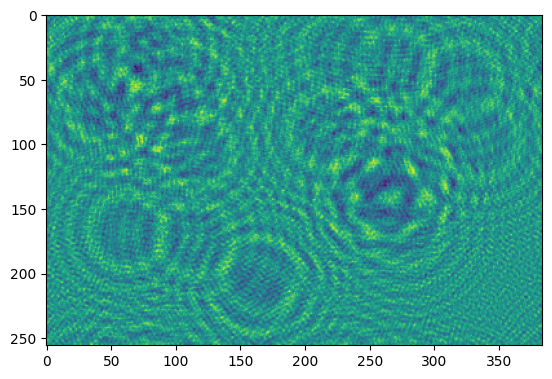

mascara


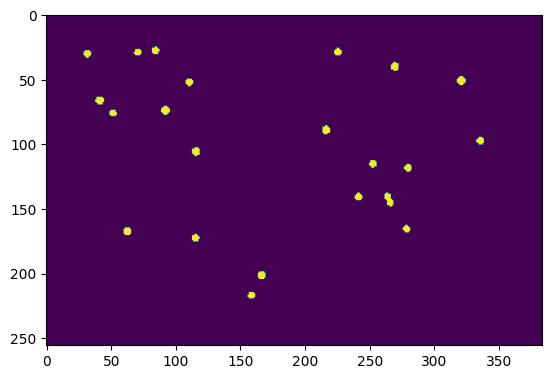

(array([0, 1], dtype=uint8), array([97628,   676]))
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
imagen


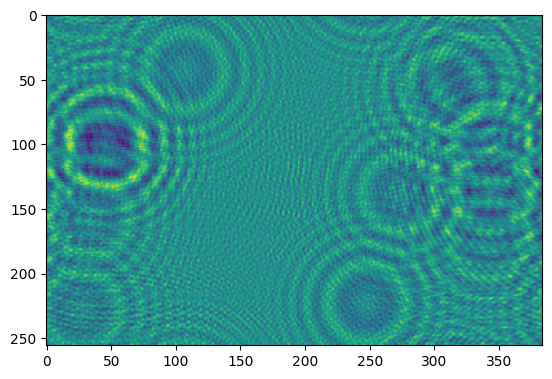

mascara


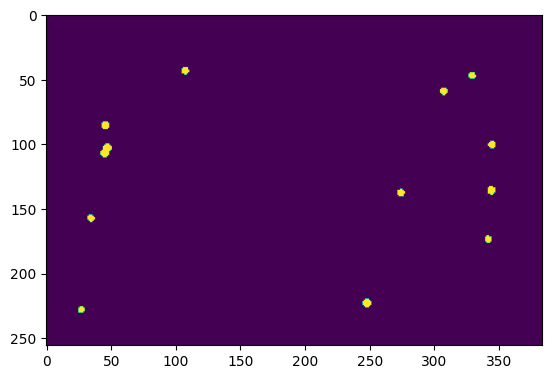

(array([0, 1], dtype=uint8), array([97926,   378]))
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
imagen


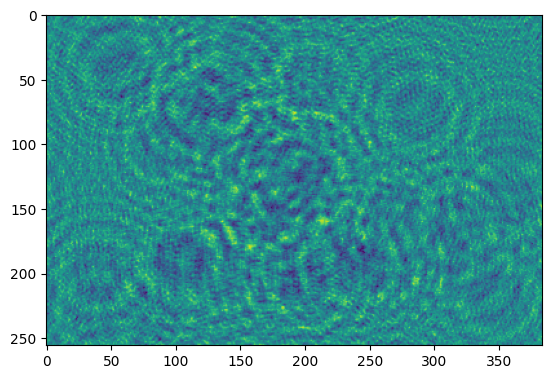

mascara


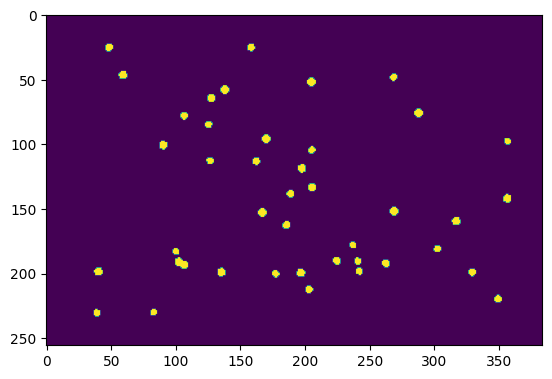

(array([0, 1], dtype=uint8), array([97053,  1251]))
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
imagen


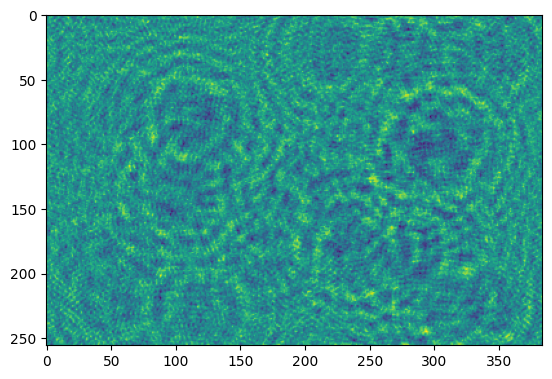

mascara


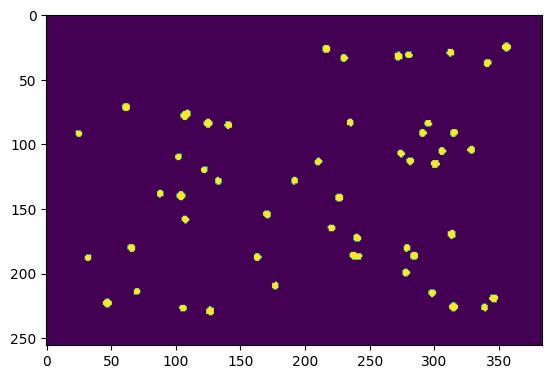

(array([0, 1], dtype=uint8), array([96833,  1471]))
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
imagen


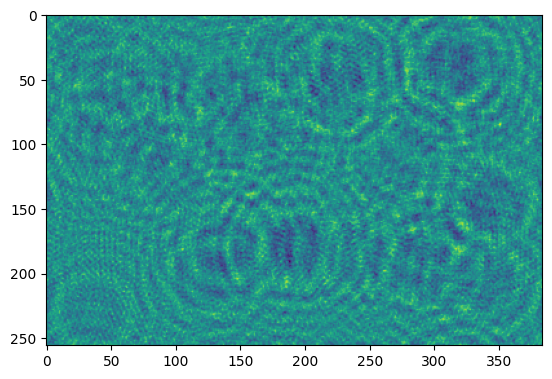

mascara


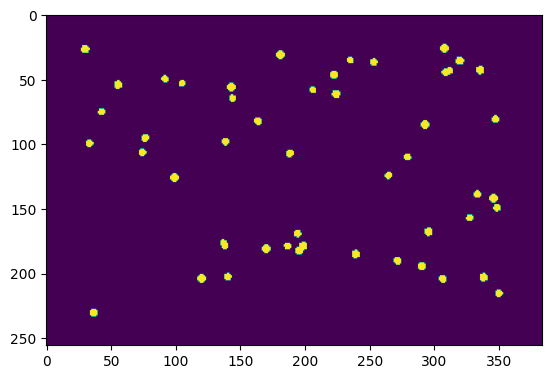

(array([0, 1], dtype=uint8), array([96824,  1480]))
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
imagen


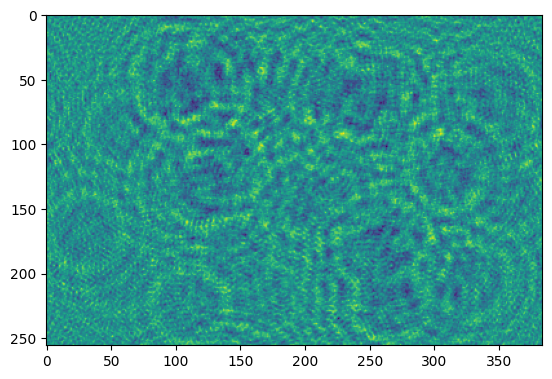

mascara


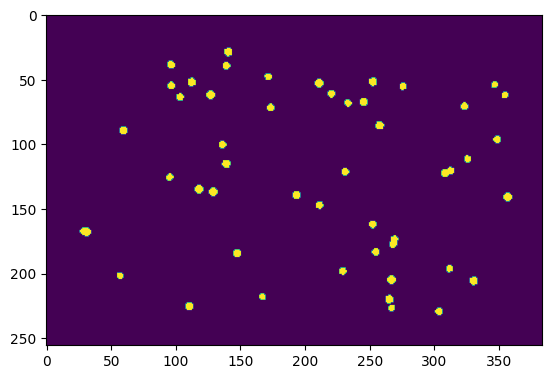

(array([0, 1], dtype=uint8), array([96848,  1456]))
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
imagen


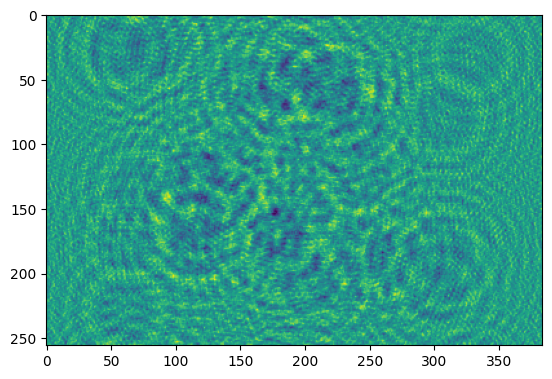

mascara


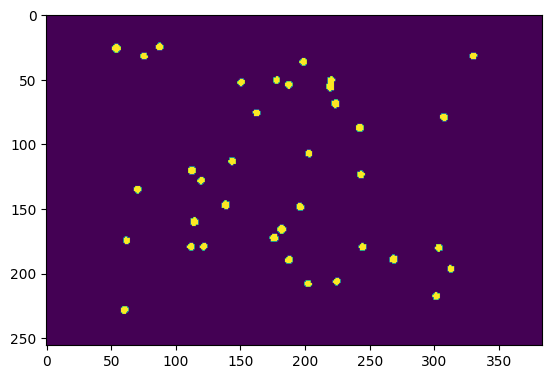

(array([0, 1], dtype=uint8), array([97232,  1072]))
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
imagen


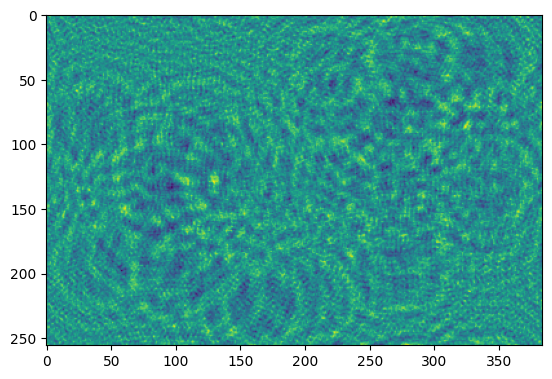

mascara


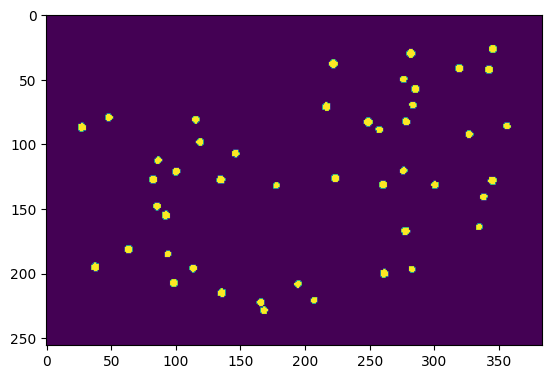

(array([0, 1], dtype=uint8), array([96946,  1358]))
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
imagen


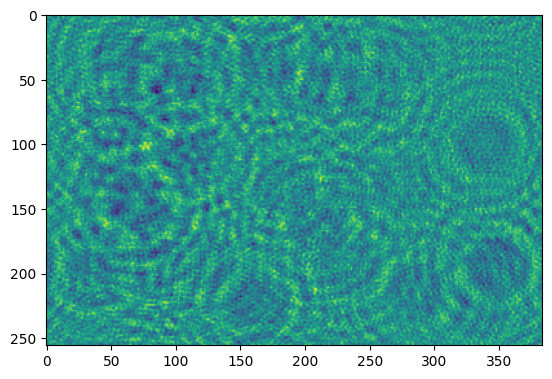

mascara


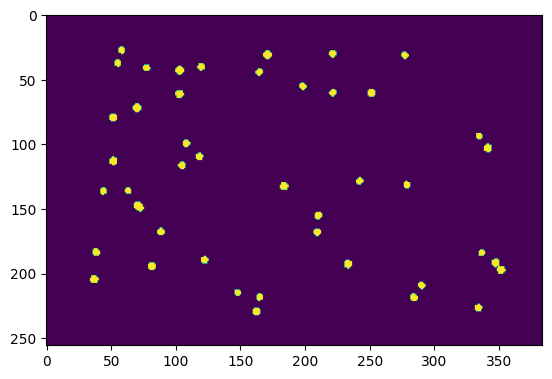

(array([0, 1], dtype=uint8), array([97011,  1293]))
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
imagen


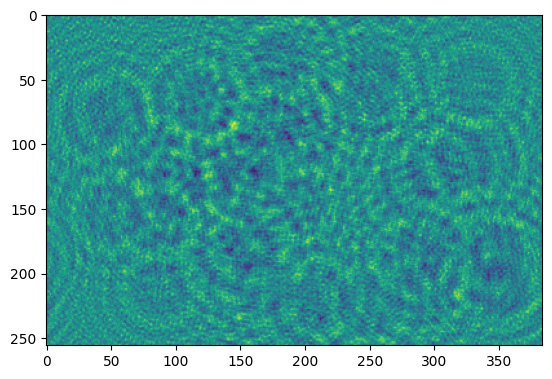

mascara


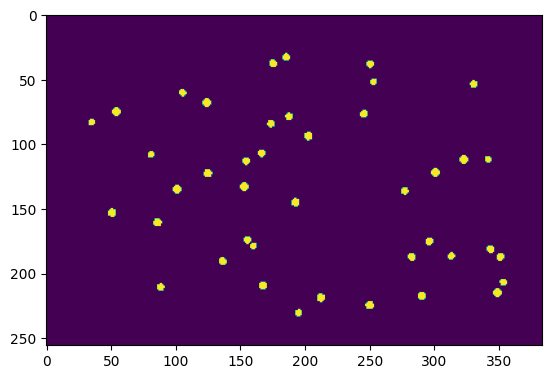

(array([0, 1], dtype=uint8), array([97041,  1263]))
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
imagen


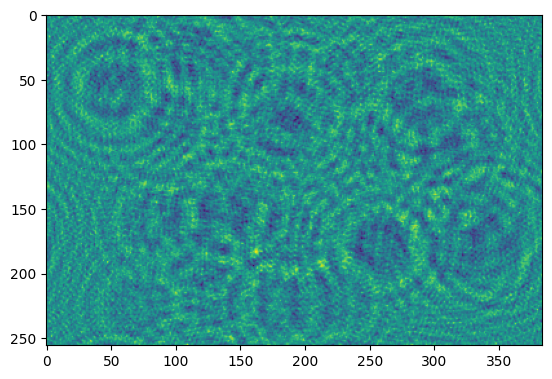

mascara


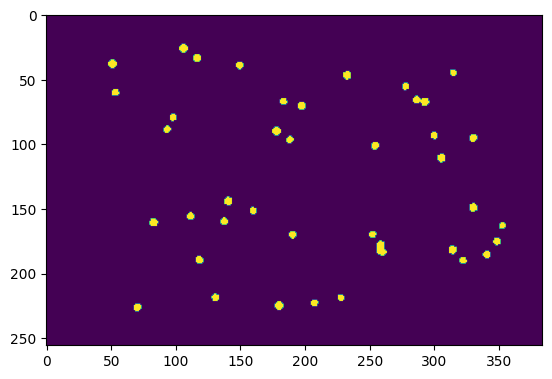

(array([0, 1], dtype=uint8), array([97097,  1207]))
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
imagen


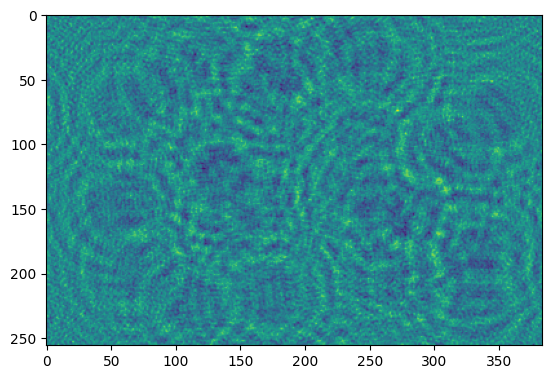

mascara


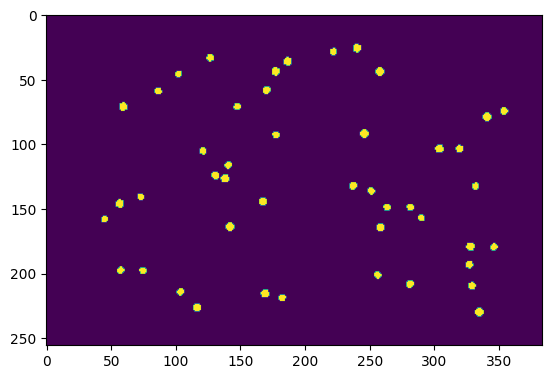

(array([0, 1], dtype=uint8), array([96963,  1341]))
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
imagen


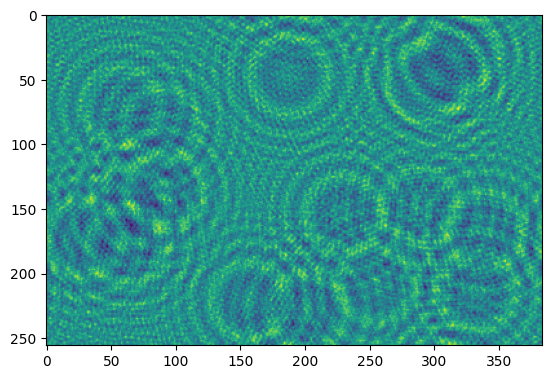

mascara


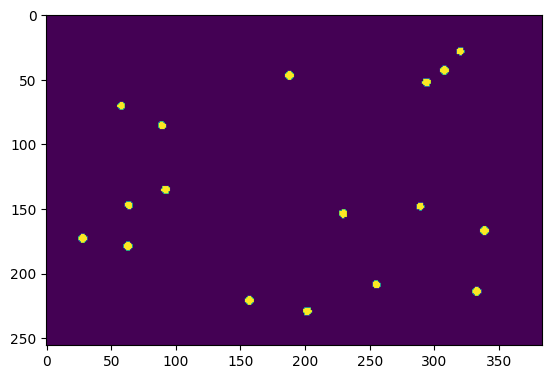

(array([0, 1], dtype=uint8), array([97735,   569]))
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
imagen


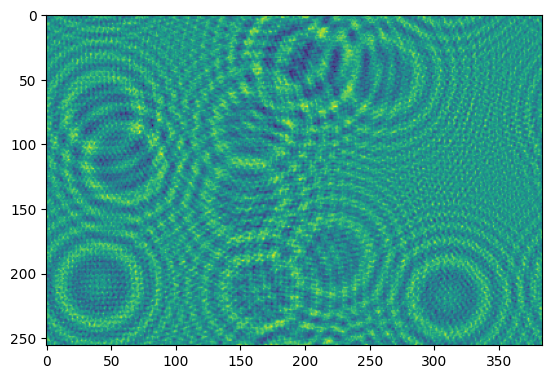

mascara


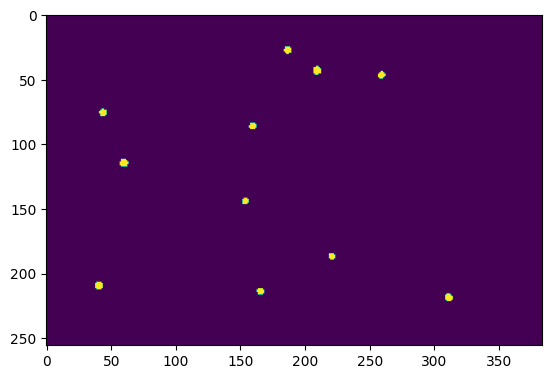

(array([0, 1], dtype=uint8), array([97998,   306]))
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
imagen


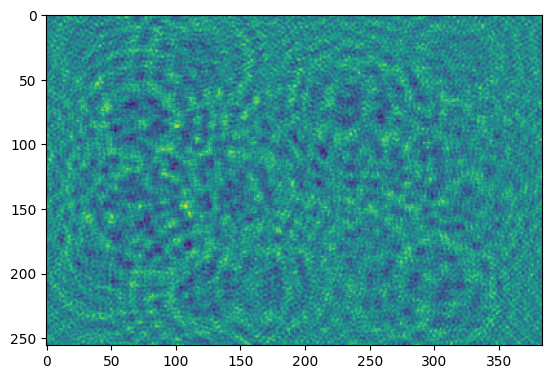

mascara


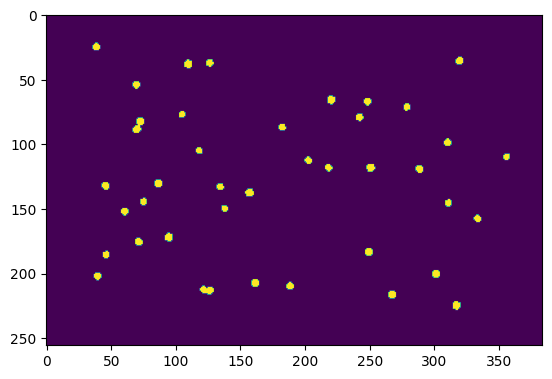

(array([0, 1], dtype=uint8), array([97134,  1170]))
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
imagen


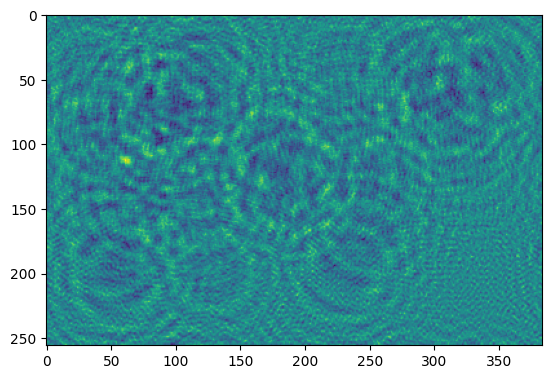

mascara


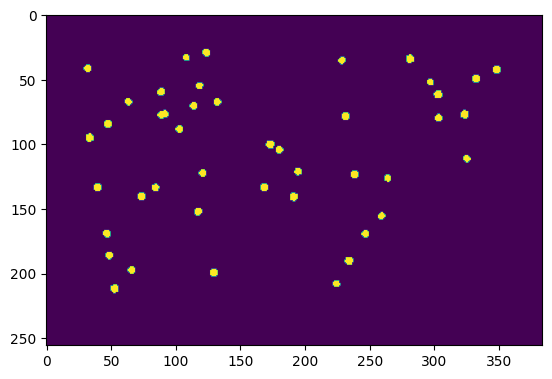

(array([0, 1], dtype=uint8), array([97021,  1283]))


In [9]:

print(train_gen.__len__())

hey=test_gen.__getitem__(0)
print(type(hey))
for x,y in zip(hey[0],hey[1]):
  print(type(x))
  print(type(y))
  print("imagen")
  plt.imshow(x)
  plt.show()
  print("mascara")
  plt.imshow(y)

  plt.show()
  print(np.unique(y,return_counts=True))


In [10]:
print(np.max(hey[0][0]))
print(np.min(hey[0][0]))

255
0


In [11]:

from tensorflow.keras import backend as K
from tensorflow.keras.utils import get_custom_objects

@keras.saving.register_keras_serializable()
@tf.keras.utils.register_keras_serializable()
def jaccard_loss(y_true, y_pred):
      # Convert predictions to probabilities
    y_true = K.cast(y_true, 'float32')
    y_pred = K.cast(y_pred, 'float32')
    y_true = K.flatten(y_true)
    y_pred = K.flatten(y_pred)
    intersection = K.sum(y_true * y_pred)
    union = K.sum(y_true) + K.sum(y_pred) - intersection
    return 1 - (intersection + 1) / (union + 1)
get_custom_objects().update({"jaccard_loss": jaccard_loss})

@keras.saving.register_keras_serializable()
@tf.keras.utils.register_keras_serializable()
def tversky_loss(y_true, y_pred, alpha=0.5, beta=2):
    # Convert predictions to probabilities
    y_true = K.cast(y_true, 'float32')
    y_pred = K.cast(y_pred, 'float32')

    # Calculate true positives (TP), false positives (FP), and false negatives (FN)
    tp = K.sum(y_true * y_pred, axis=-1)
    fp = K.sum((1 - y_true) * y_pred, axis=-1)
    fn = K.sum(y_true * (1 - y_pred), axis=-1)

    # Calculate the Tversky index
    tversky_index = (tp + K.epsilon()) / (tp + alpha * fp + beta * fn + K.epsilon())

    # Return the Tversky loss
    return 1 - tversky_index
get_custom_objects().update({"tversky_loss": tversky_loss})

@keras.saving.register_keras_serializable()
@tf.keras.utils.register_keras_serializable()
def iou(y_true, y_pred, smooth=1):
    intersection = K.sum(K.abs(y_true * y_pred), axis=[1,2,3])
    sum_ = K.sum(K.abs(y_true) + K.abs(y_pred), axis=[1,2,3])
    iou = (intersection + smooth) / (sum_ - intersection + smooth)
    return iou
get_custom_objects().update({"iou": iou})

@keras.saving.register_keras_serializable()
@tf.keras.utils.register_keras_serializable()
def dice_coef_loss(y_true, y_pred):
    smooth = 1.0
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return 1 - ((2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth))

# Register the custom loss function
get_custom_objects().update({"dice_coef_loss": dice_coef_loss})

@keras.saving.register_keras_serializable()
@tf.keras.utils.register_keras_serializable()
def pixel_accuracy(y_true, y_pred):
    y_pred = K.round(y_pred)
    correct_pixels = K.sum(K.cast(K.equal(y_true, y_pred), K.floatx()))
    total_pixels = K.cast(K.prod(K.shape(y_true)), K.floatx())
    return (correct_pixels / total_pixels)
get_custom_objects().update({"pixel_accuracy": pixel_accuracy})

@keras.saving.register_keras_serializable()
@tf.keras.utils.register_keras_serializable()
def specificity(y_true, y_pred):
    y_true = tf.cast(y_true, tf.int32)
    y_pred = tf.cast(tf.round(y_pred), tf.int32)

    # True Negatives
    tn = tf.reduce_sum(tf.cast(tf.logical_and(tf.equal(y_true, 0), tf.equal(y_pred, 0)), tf.float32))

    # False Positives
    fp = tf.reduce_sum(tf.cast(tf.logical_and(tf.equal(y_true, 0), tf.equal(y_pred, 1)), tf.float32))

    specificity = tn / (tn + fp + K.epsilon())
    return specificity
get_custom_objects().update({"specificity": specificity})

@keras.saving.register_keras_serializable()
@tf.keras.utils.register_keras_serializable()
def focal_loss(y_true, y_pred):
        gamma=2.,
        alpha=0.25
        y_true = tf.convert_to_tensor(y_true, dtype=tf.float32)
        y_pred = tf.convert_to_tensor(y_pred, dtype=tf.float32)

        # Clip the prediction values to prevent NaNs
        epsilon = K.epsilon()
        y_pred = K.clip(y_pred, epsilon, 1. - epsilon)

        # Compute cross-entropy loss
        cross_entropy = -y_true * K.log(y_pred)

        # Compute weight
        weight = alpha * y_true * K.pow((1 - y_pred), gamma)

        # Compute Focal Loss
        loss = weight * cross_entropy
        return K.sum(loss, axis=1)

get_custom_objects().update({"focal_loss": focal_loss})

@keras.saving.register_keras_serializable()
@tf.keras.utils.register_keras_serializable()
def combined_loss(y_true, y_pred):
    # Binary cross-entropy loss
    bce = tf.keras.losses.BinaryCrossentropy()(y_true, y_pred)

    # Dice loss
    dice = 1 - (2 * tf.reduce_sum(y_true * y_pred) + 1) / (tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) + 1)

    return bce + dice

## Train a model  without quantization aware training

precarga model del original i finetune amb dades enteres

mobilnet

In [12]:
import tempfile
import os

import tensorflow as tf

from tensorflow_model_optimization.python.core.keras.compat import keras
from tensorflow.keras.applications import MobileNet


def create_mobilenet_encoder(input):
    #extra layer to simulate 3 channels ( testejar)
    x = keras.layers.Conv2D(3, (1, 1), padding='same',use_bias=False, activation='relu')(input)

    # Define the MobileNet architecture
    x = keras.layers.Conv2D(32, (3, 3), (2,2), padding='same', use_bias=False, name='conv1')(x)
    x = keras.layers.BatchNormalization(name='conv1_bn')(x)
    x = keras.layers.ReLU(6., name='conv1_relu')(x)

    def depthwise_conv_block(inputs, pointwise_conv_filters, block_id, strides=(1, 1)):
        x = keras.layers.DepthwiseConv2D((3, 3),  padding='same' if strides == (1, 1) else 'valid', strides=strides, use_bias=False, name=f'conv_dw_{block_id}')(inputs)
        x = keras.layers.BatchNormalization(name=f'conv_dw_{block_id}_bn')(x)
        x = keras.layers.ReLU(6., name=f'conv_dw_{block_id}_relu')(x)

        x = keras.layers.Conv2D(pointwise_conv_filters, (1, 1), padding='same', use_bias=False, name=f'conv_pw_{block_id}')(x)
        x = keras.layers.BatchNormalization(name=f'conv_pw_{block_id}_bn')(x)
        x = keras.layers.ReLU(6., name=f'conv_pw_{block_id}_relu')(x)

        return x

    x = depthwise_conv_block(x, 64, block_id=1)
    x = keras.layers.ZeroPadding2D(padding=((0, 1), (0, 1)), name='conv_pad_2')(x)
    x = depthwise_conv_block(x, 128, block_id=2, strides=(2, 2))

    x = depthwise_conv_block(x, 128, block_id=3)
    x = keras.layers.ZeroPadding2D(padding=((0, 1), (0, 1)), name='conv_pad_4')(x)
    x = depthwise_conv_block(x, 256, block_id=4, strides=(2, 2))

    x = depthwise_conv_block(x, 256, block_id=5)
    x = keras.layers.ZeroPadding2D(padding=((0, 1), (0, 1)), name='conv_pad_6')(x)
    x = depthwise_conv_block(x, 512, block_id=6, strides=(2, 2))

    for i in range(7, 12):
        x = depthwise_conv_block(x, 512, block_id=i)

    x = keras.layers.ZeroPadding2D(padding=((0, 1), (0, 1)), name='conv_pad_12')(x)
    x = depthwise_conv_block(x, 1024, block_id=12, strides=(2, 2))

    x = depthwise_conv_block(x, 1024, block_id=13)

    return x


def create_decoder(encoder_output, transpose=True, dropout=0.1):

    # Define the decoder blocks
    def create_decoder_block(input,filters, transpose=True, dropout=0.1, name=""):

        if transpose:
            x = keras.layers.Conv2DTranspose(filters, (2, 2), strides=(2, 2), padding='same', name=name+"_trans")(input)
        else:
            x = keras.layers.UpSampling2D((2, 2), interpolation="bilinear")(input)

        x = keras.layers.Conv2D(filters, (3, 3), padding='same', activation='relu',name=name)(x)
        x = keras.layers.Dropout(dropout)(x)  # adjust dropout as needed
        return x

    # Define the decoder architecture
    x=create_decoder_block(encoder_output,512, transpose=transpose, dropout=dropout)

    x=create_decoder_block(x ,256 ,transpose=transpose, dropout=dropout, name='dec_conv_1')
    x=create_decoder_block(x ,128 ,transpose=transpose, dropout=dropout, name='dec_conv_2')
    x=create_decoder_block(x ,64 , transpose=transpose, dropout=dropout, name='dec_conv_3')
    x=create_decoder_block(x ,32 , transpose=transpose, dropout=dropout, name='dec_conv_4')

    return x

# Create the model
def build_model(input_shape, load_weights=True, load_weight_route=''):

  input_shape=(input_shape[0], input_shape[1], 1)
  inputs = keras.layers.Input(input_shape)

  encoder = create_mobilenet_encoder(inputs)
  decoder = create_decoder(encoder, transpose=False)
  outputs = keras.layers.Conv2D(1, (1, 1), activation='sigmoid')(decoder)

  model = keras.models.Model(inputs, outputs)

  #load pretrained
  if load_weights:

    if load_weight_route=='':
      pretrained_mobilenet = MobileNet(include_top=False, weights='imagenet', input_shape=(256, 384, 3))
    else:
      pretrained_mobilenet = keras.models.load_model(load_weight_route,safe_mode=False)

    for layer in model.layers:
      if layer.name in [l.name for l in pretrained_mobilenet.layers]:
          print(f"Copying weights from {layer.name} to {model.get_layer(name=layer.name).name}")
          layer.set_weights(pretrained_mobilenet.get_layer(name=layer.name).get_weights())


  return model


load_weight_route='/content/gdrive/MyDrive/Curro/Hologrames/Datos_sinteticos/Holo_subdiv/Net_325_256_prof_950_830_siz_8_18/Mobilenet_Upsampling_No_lambda_384_full.keras'
input_shape= (256, 384)
model =build_model(input_shape,load_weights=True,load_weight_route=load_weight_route)
model.summary()


Copying weights from conv1 to conv1
Copying weights from conv1_bn to conv1_bn
Copying weights from conv1_relu to conv1_relu
Copying weights from conv_dw_1 to conv_dw_1
Copying weights from conv_dw_1_bn to conv_dw_1_bn
Copying weights from conv_dw_1_relu to conv_dw_1_relu
Copying weights from conv_pw_1 to conv_pw_1
Copying weights from conv_pw_1_bn to conv_pw_1_bn
Copying weights from conv_pw_1_relu to conv_pw_1_relu
Copying weights from conv_pad_2 to conv_pad_2
Copying weights from conv_dw_2 to conv_dw_2
Copying weights from conv_dw_2_bn to conv_dw_2_bn
Copying weights from conv_dw_2_relu to conv_dw_2_relu
Copying weights from conv_pw_2 to conv_pw_2
Copying weights from conv_pw_2_bn to conv_pw_2_bn
Copying weights from conv_pw_2_relu to conv_pw_2_relu
Copying weights from conv_dw_3 to conv_dw_3
Copying weights from conv_dw_3_bn to conv_dw_3_bn
Copying weights from conv_dw_3_relu to conv_dw_3_relu
Copying weights from conv_pw_3 to conv_pw_3
Copying weights from conv_pw_3_bn to conv_pw_3

unet

In [13]:


from tensorflow_model_optimization.python.core.keras.compat import keras

import tensorflow as tf



def double_conv_block(x, n_filters):
   # Conv2D then ReLU activation
   x = keras.layers.Conv2D(n_filters, 3, padding = "same", activation = "relu", kernel_initializer = "he_normal")(x)
   # Conv2D then ReLU activation
   x = keras.layers.Conv2D(n_filters, 3, padding = "same", activation = "relu", kernel_initializer = "he_normal")(x)
   return x

def downsample_block(x, n_filters):
   f = double_conv_block(x, n_filters)
   p = keras.layers.MaxPool2D(2)(f)
   p = keras.layers.Dropout(0.3)(p)
   return f, p

def upsample_block(x, conv_features, n_filters):
   # upsample
   x = keras.layers.Conv2DTranspose(n_filters, 3, 2, padding="same")(x)
   # concatenate
   x = keras.layers.concatenate([x, conv_features])
   # dropout
   x = keras.layers.Dropout(0.3)(x)
   # Conv2D twice with ReLU activation
   x = double_conv_block(x, n_filters)
   return x

def build_unet_model( input_shape= (256,384,1)):
    # inputs
   inputs = keras.layers.Input(shape=input_shape)

   # encoder: contracting path - downsample
   # 1 - downsample
   f1, p1 = downsample_block(inputs, 64)
   # 2 - downsample
   f2, p2 = downsample_block(p1, 128)
   # 3 - downsample
   f3, p3 = downsample_block(p2, 256)
   # 4 - downsample
   f4, p4 = downsample_block(p3, 512)

   # 5 - bottleneck
   bottleneck = double_conv_block(p4, 1024)

   # decoder: expanding path - upsample
   # 6 - upsample
   u6 = upsample_block(bottleneck, f4, 512)
   # 7 - upsample
   u7 = upsample_block(u6, f3, 256)
   # 8 - upsample
   u8 = upsample_block(u7, f2, 128)
   # 9 - upsample
   u9 = upsample_block(u8, f1, 64)

   # outputs
   #outputs = layers.Conv2D(3, 1, padding="same", activation = "softmax")(u9)

   outputs = keras.layers.Conv2D(1, (1, 1), activation='sigmoid')(u9)
   # unet model with Keras Functional API
   unet_model = keras.models.Model(inputs, outputs, name="U-Net")

   return unet_model
input_shape= (256, 384,1)
model = build_unet_model(input_shape)

# load Unet_from pretrain
ruta_unet= "/content/gdrive/MyDrive/Curro/Hologrames/Datos_sinteticos/Holo_subdiv/Net_325_256_prof_950_800_siz_11_14/UNET_384_Only_11_14.keras"
pretrain = keras.models.load_model(ruta_unet,safe_mode=False)
model.set_weights(pretrain.get_weights())
model.summary()

Model: "U-Net"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 256, 384, 1)]        0         []                            
                                                                                                  
 conv2d_2 (Conv2D)           (None, 256, 384, 64)         640       ['input_2[0][0]']             
                                                                                                  
 conv2d_3 (Conv2D)           (None, 256, 384, 64)         36928     ['conv2d_2[0][0]']            
                                                                                                  
 max_pooling2d (MaxPooling2  (None, 128, 192, 64)         0         ['conv2d_3[0][0]']            
 D)                                                                                           

In [14]:

model.compile(
    optimizer=keras.optimizers.Adam(1e-4), loss=jaccard_loss,#dice_coef_loss,#"binary_crossentropy",#1e-4,, , adamW,weight_decay=0.01
    metrics=[
    jaccard_loss,
    keras.metrics.Recall() ,
    specificity,
    keras.metrics.Precision(),
    pixel_accuracy,
    dice_coef_loss,
    keras.metrics.BinaryIoU( target_class_ids=(0, 1), threshold=0.5, name=None, dtype=None),
    iou,
    focal_loss

]
)

In [15]:
from tqdm.notebook import tqdm as tq


def manual_train(model,train_gen,val_gen,epochs):
  for epoch in range(1,epochs+1):
    print("epoch"+str(epoch))
    # full training a manita
    for i in tq(range(0,train_gen.__len__())):
      train_data=train_gen.__getitem__(i)
      train_images =train_data[0]
      train_labels=train_data[1]

      model.fit(
          train_images,
          train_labels,
          epochs=1,
          verbose=0
        )

    print("Eval epoch"+str(epoch))
    tot_results=[]
    for i in tq(range(0,val_gen.__len__())):
        val_data=val_gen.__getitem__(i)
        val_images =val_data[0]
        val_labels=val_data[1]
        results=model.evaluate( train_images, train_labels, verbose=0)
        tot_results.append(results)
    metricas = "loss: {:.3f},jaccard_loss: {:.3f}, Recall: {:.3f}, Specificity: {:.3f}, Precision: {:.3f}, Pixel Accuracy: {:.3f}, Dice Loss: {:.3f}, Binary IoU: {:.3f}, IoU: {:.3f}, Focal Loss: {:.3f}"
    mean_results = np.mean(np.array(tot_results), axis=0)
    print(metricas.format(*mean_results))

    train_gen.on_epoch_end()



In [ ]:
epochs=6
manual_train(model,train_gen,val_gen,epochs)

epoch1


  0%|          | 0/437 [00:00<?, ?it/s]

## Clone and fine-tune pre-trained model with quantization aware training


In [ ]:
import tensorflow_model_optimization as tfmot

quantize_model = tfmot.quantization.keras.quantize_model

# q_aware stands for for quantization aware.
q_aware_model = quantize_model(model)

# `quantize_model` requires a recompile.
q_aware_model.compile(
    optimizer=keras.optimizers.Adam(1e-4), loss=jaccard_loss,#dice_coef_loss,#"binary_crossentropy",#1e-4,, , adamW,weight_decay=0.01
    metrics=[
    jaccard_loss,
    keras.metrics.Recall() ,
    specificity,
    keras.metrics.Precision(),
    pixel_accuracy,
    dice_coef_loss,
    keras.metrics.BinaryIoU( target_class_ids=(0, 1), threshold=0.5, name=None, dtype=None),
    iou,
    focal_loss

]
)

q_aware_model.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 256, 384, 1)]     0         
                                                                 
 quantize_layer_1 (Quantize  (None, 256, 384, 1)       3         
 Layer)                                                          
                                                                 
 quant_conv2d_2 (QuantizeWr  (None, 256, 384, 3)       12        
 apperV2)                                                        
                                                                 
 quant_conv1 (QuantizeWrapp  (None, 128, 192, 32)      929       
 erV2)                                                           
                                                                 
 quant_conv1_bn (QuantizeWr  (None, 128, 192, 32)      129       
 apperV2)                                                  

### Train and evaluate the model against baseline

In [ ]:
epochs=4
manual_train(q_aware_model,train_gen,val_gen,epochs)

epoch1


  0%|          | 0/500 [00:00<?, ?it/s]

Eval epoch1


  0%|          | 0/150 [00:00<?, ?it/s]

loss: 0.462,jaccard_loss: 0.462, Recall: 0.747, Specificity: 0.998, Precision: 0.658, Pixel Accuracy: 0.997, Dice Loss: 0.301, Binary IoU: 0.768, IoU: 0.547, Focal Loss: 1.030
epoch2


  0%|          | 0/500 [00:00<?, ?it/s]

Eval epoch2


  0%|          | 0/150 [00:00<?, ?it/s]

loss: 0.294,jaccard_loss: 0.294, Recall: 0.874, Specificity: 0.999, Precision: 0.787, Pixel Accuracy: 0.998, Dice Loss: 0.172, Binary IoU: 0.852, IoU: 0.712, Focal Loss: 0.482
epoch3


  0%|          | 0/500 [00:00<?, ?it/s]

Eval epoch3


  0%|          | 0/150 [00:00<?, ?it/s]

loss: 0.248,jaccard_loss: 0.248, Recall: 0.875, Specificity: 0.999, Precision: 0.843, Pixel Accuracy: 0.999, Dice Loss: 0.142, Binary IoU: 0.875, IoU: 0.758, Focal Loss: 0.489
epoch4


  0%|          | 0/500 [00:00<?, ?it/s]

Eval epoch4


  0%|          | 0/150 [00:00<?, ?it/s]

loss: 0.237,jaccard_loss: 0.237, Recall: 0.869, Specificity: 0.999, Precision: 0.863, Pixel Accuracy: 0.999, Dice Loss: 0.134, Binary IoU: 0.881, IoU: 0.777, Focal Loss: 0.446


[0.9956337809562683, 0.9956337809562683, 1.0, 0.0038722266908735037, 0.004365585744380951, 0.008204142563045025, 0.9913061857223511, 0.004118906334042549, 0.004375749733299017, 4.714930501294216e-22]
[0.24001717567443848, 0.24001717567443848, 0.8516082167625427, 0.9994712471961975, 0.8755448460578918, 0.9988282322883606, 0.1363847851753235, 0.8796652555465698, 0.7642076015472412, 0.5934454798698425]


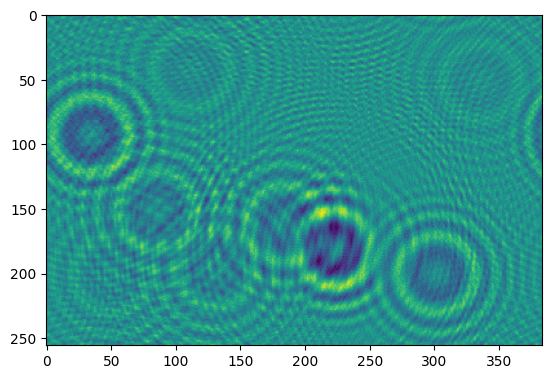

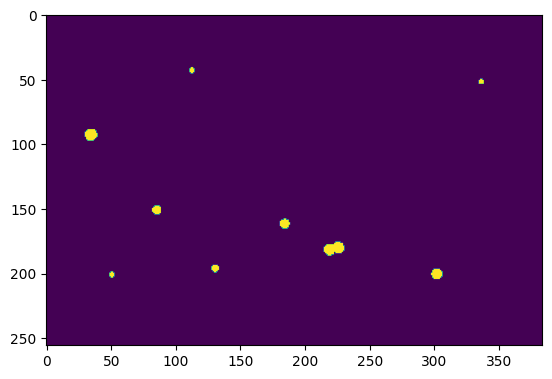

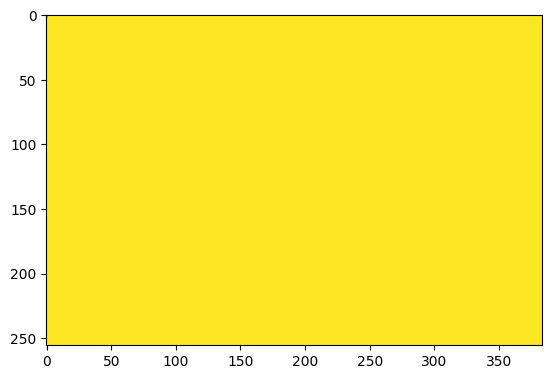

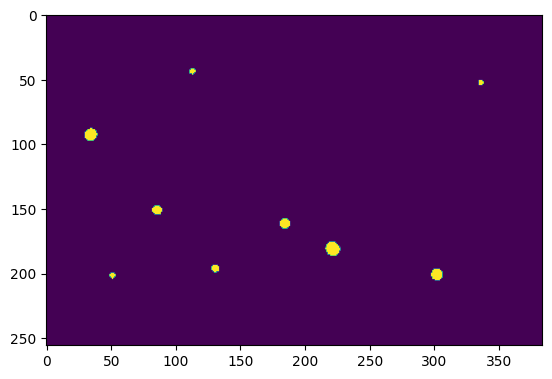

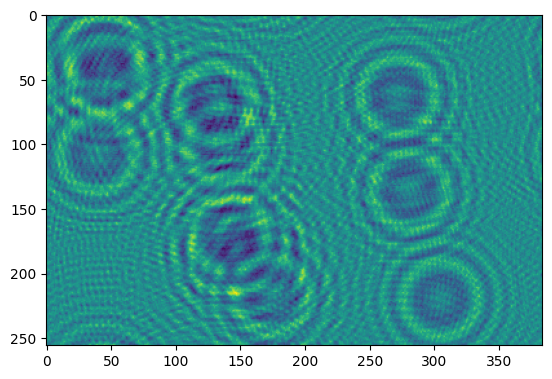

...

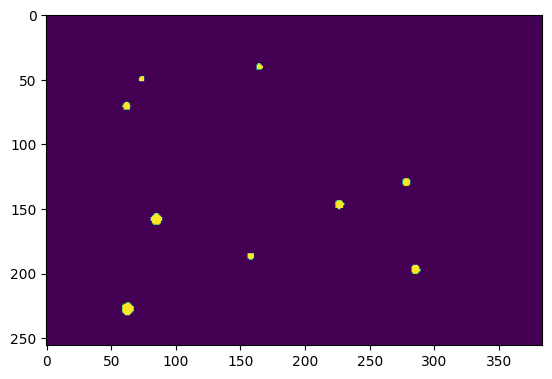

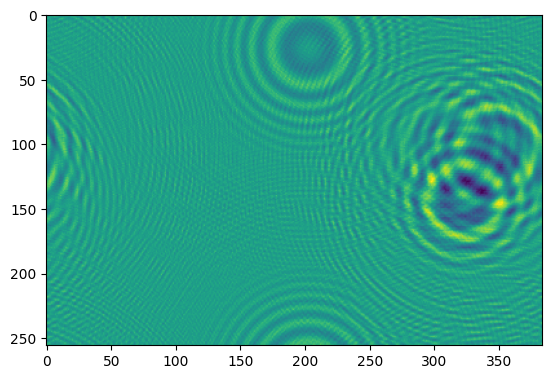

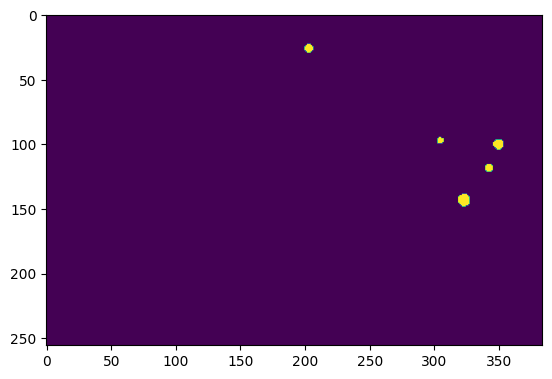

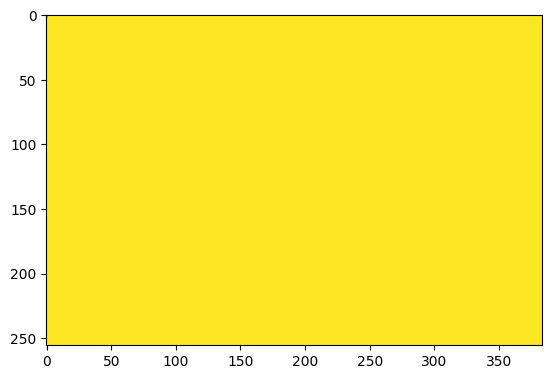

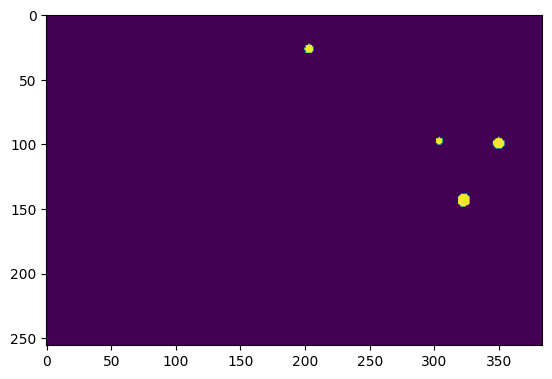

In [ ]:
test_data=test_gen.__getitem__(0)
test_images =test_data[0]
test_labels=test_data[1]


print(model.evaluate(test_images, test_labels, verbose=0))
preds=model.predict(test_images, verbose=0)

print(q_aware_model.evaluate(test_images, test_labels, verbose=0))
preds_q=q_aware_model.predict(test_images, verbose=0)

for imagen, label, pred, pred_q in zip(test_images, test_labels, preds, preds_q):
  plt.imshow(imagen)
  plt.show()
  plt.imshow(label)
  plt.show()

  plt.imshow(pred)
  plt.show()

  plt.imshow(pred_q)
  plt.show()


## Create quantized model for TFLite backend

In [ ]:
model_nom= '/content/gdrive/MyDrive/Curro/Hologrames/models/quantitzed_384_8_18_mobilnet2.tflite'


In [ ]:
test_data=test_gen.__getitem__(0)
train_images =test_data[0].astype(np.float32)
def representative_data_gen():
  for input_value in tf.data.Dataset.from_tensor_slices(train_images).batch(1).take(100):
    yield [input_value]


In [ ]:
converter = tf.lite.TFLiteConverter.from_keras_model(q_aware_model)
converter.optimizations = [tf.lite.Optimize.DEFAULT]

#test_data=test_gen.__getitem__(0)
#representative_data_gen =test_data[0]

converter.representative_dataset = representative_data_gen
# necessary per guardar un model que accepta inputs de unint8
converter.target_spec.supported_ops = [tf.lite.OpsSet.TFLITE_BUILTINS_INT8]
# Set the input and output tensors to uint8 (APIs added in r2.3)
converter.inference_input_type = tf.uint8
converter.inference_output_type = tf.uint8

quantized_tflite_model = converter.convert()

NameError: name 'q_aware_model' is not defined

In [ ]:

with open(model_nom, 'wb') as f:
    f.write(quantized_tflite_model)

print(f"TFLite model saved to {model_nom}")

TFLite model saved to /content/gdrive/MyDrive/Curro/Hologrames/models/quantitzed_384_8_18_mobilnet2.tflite


# Load model and test

In [31]:
import numpy as np
import cv2
import os
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
import matplotlib.patches as patches
import time
import keras


class Detector():
  def __init__(self,original_shape_cut=(1024,1536),model_shape=(256,384),step_size=(128,128), cellCluster_size=80, min_confidence=0.5):
      np.seterr(divide='ignore', invalid='ignore')

      self.original_shape_cut=original_shape_cut
      self.step_size= step_size

      self.model_shape=model_shape
      self.resize_factor=original_shape_cut[0]/model_shape[0]
      self.min_cellCluster_size=cellCluster_size
      self.min_confidence = min_confidence

  def normalize_images(self,array):
    min_val = np.min(array)
    max_val = np.max(array)
    scaled_array = 2 * (array - min_val) / (max_val - min_val) - 1
    return scaled_array

  def current_milli_time(self):
      return round(time.time() * 1000)

  def convert_to_int(self, array):
      min_val = np.min(array)
      max_val = np.max(array)
      scaled_array = 255 * (array - min_val) / (max_val - min_val)
      return np.array(scaled_array).astype(np.uint8)

  def get_subsegments(self, im):
      images = []
      size_cut_y = self.original_shape_cut[0]
      size_cut_x = self.original_shape_cut[1]
      step_size_y =self.step_size[0]
      step_size_x = self.step_size[1] # int(size_cut_x * self.step)
      rez_fac = self.resize_factor

      # Convert image to NumPy array
      im_np = np.array(im)
      #median_value = np.median(im_np) si queremos recortar boders
      # Cut subsegments of self.original_size_cut
      x_cuts=im_np.shape[0]//step_size_x+1
      y_cuts=im_np.shape[0]//step_size_y+1
      x_size=step_size_x*x_cuts
      y_size=step_size_y*y_cuts

      cuts = [x_cuts, y_cuts]
      positions = []

      for i in range(0, x_size, step_size_x):
          for j in range(0, y_size, step_size_y):
              if i  < x_size and j  < y_size:
                  positions.append([i / rez_fac, j / rez_fac])
                  subsegment=np.zeros((size_cut_y,size_cut_x))
                  cut=im_np[j:j + size_cut_y, i:i + size_cut_x]
                  subsegment[0:cut.shape[0], 0:cut.shape[1]] = cut
                  resized_sub = cv2.resize(subsegment, (self.model_shape[1], self.model_shape[0]))
                  images.append(self.normalize_images(resized_sub))

      return images, cuts, positions



In [32]:
model_nom= '/content/gdrive/MyDrive/Curro/Hologrames/models/quantitzed_384_8_18_mobilnet2.tflite'

In [33]:
import numpy as np
import tensorflow as tf
# Load the TFLite model and allocate tensors.
interpreter = tf.lite.Interpreter(model_path=model_nom)
interpreter.allocate_tensors()


In [34]:



# Get input and output tensors.
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

# Test the model on random input data.
input_shape = input_details[0]['shape']


In [35]:
input_type = input_details[0]['dtype']
print('input: ', input_type)
output_type = output_details[0]['dtype']
print('output: ', output_type)

input:  <class 'numpy.uint8'>
output:  <class 'numpy.uint8'>


In [ ]:
print(np.array(np.random.random_sample(input_shape), dtype=np.float32).shape)

(1, 256, 384, 1)


Tiempo de prediccon:
315


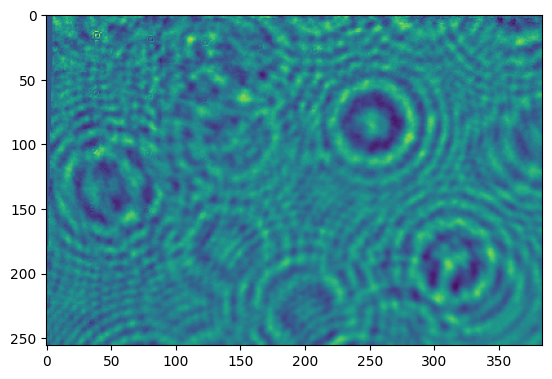

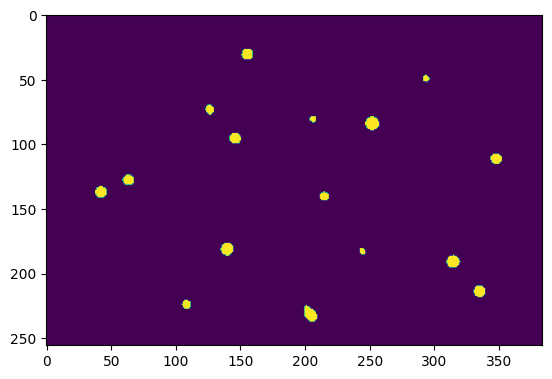

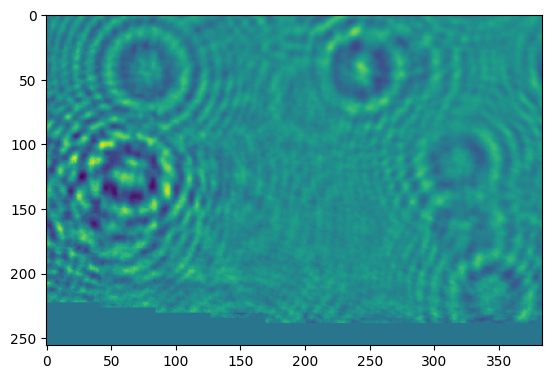

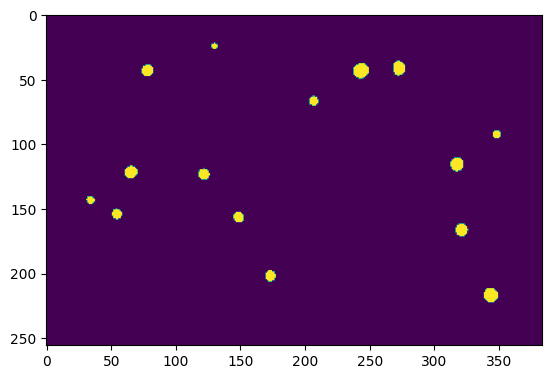

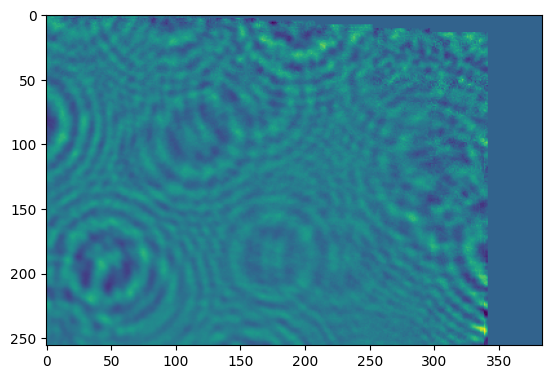

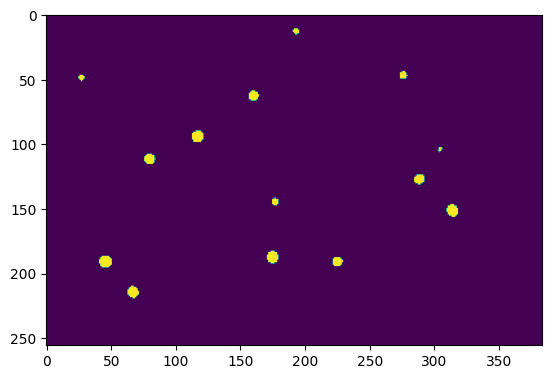

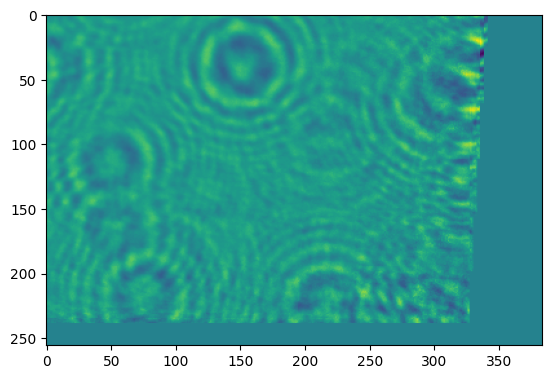

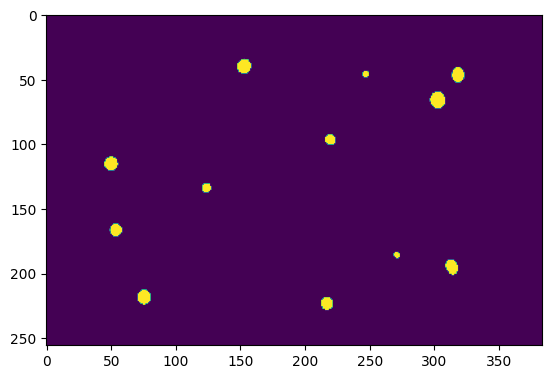

In [38]:


import os

import keras
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import math


carpeta_reals="/content/gdrive/MyDrive/Curro/Hologrames/Datos_reales/2024_01_25/Samples_03_2_normalized_mosaic"

original_shape_cut=(1024,1536)
model_shape=(256,384)
step_size=(math.floor(original_shape_cut[0]*0.98), math.floor(original_shape_cut[1]*0.7))


detector=Detector( cellCluster_size=20,original_shape_cut=original_shape_cut,model_shape=model_shape,step_size=step_size, min_confidence =0.4) #original_shape_cut,model_shape,

for f in os.listdir(carpeta_reals):
  im = Image.open(carpeta_reals +"/"+ f)
  # get all images
  images, cuts, positions = detector.get_subsegments(im)
  tot_images_pross=[]
  for img in images:
    input_data =img
    input_data = np.expand_dims(input_data, axis=2)
    #plt.imshow(input_data)
    #plt.show()

    input_data = np.expand_dims(input_data, axis=0)
    input_data= detector.convert_to_int(input_data)  # es la conversio a 0 255
    tot_images_pross.append(input_data)


  #predict using quantitized model
  prediccions=[]
  initime=detector.current_milli_time()
  for imagen in tot_images_pross:
    imagen=imagen

    interpreter.set_tensor(input_details[0]['index'], imagen)

    interpreter.invoke()

    output_data = interpreter.get_tensor(output_details[0]['index'])
    prediccions.append(output_data)


  print("Tiempo de prediccon:")
  print(detector.current_milli_time()-initime)

  for img, pred in zip(tot_images_pross, prediccions):
    plt.imshow(img[0])
    plt.show()
    plt.imshow(pred[0])
    plt.show()


# Get weights and biases

In [ ]:
'''
alternativa https://netron.app/



    '''